In [111]:
#In this project I will look at a movies database. This will allow me to find unexpected correlations between categories.
#I will first do a small amount of cleaning.
#I will then make some graphs that look at some expected correlations.
#Finally I will look at a correlation matrix and make graphs of unexpected correlations. 

In [72]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None



# Now we need to read in the data
df = pd.read_csv(r'C:\Users\Aiden\Documents\DataAnalystProjects\PythonProjects\pythonJupyter\movies.csv')

In [73]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,4.699877e+07,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,5.885311e+07,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,5.383751e+08,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,8.345354e+07,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,3.984634e+07,Orion Pictures,98.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000.0,3.975460e+07,Paramount Pictures,95.0
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000.0,1.152299e+08,Universal Pictures,133.0
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000.0,2.340243e+07,Chartoff-Winkler Productions,129.0
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000.0,1.081857e+08,Dovemead Films,127.0
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000.0,1.579519e+07,United Artists,100.0


In [74]:
#Finding anything missing

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [75]:
# Data Types for our columns

print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [76]:
#cleaning some of the data
df = df.dropna(subset=['budget'])
df['budget'] = df['budget'].astype('int64')


df = df.dropna(subset=['gross'])
df['gross'] = df['gross'].astype('int64')

In [77]:
#checking if it worked
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 0%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 0%
gross - 0%
company - 0%
runtime - 0%


In [78]:
pd.set_option('display.max_rows',None)

In [79]:
df = df.sort_values(by=['gross'], inplace=False, ascending=False)

In [80]:
#MAKING GRAPHS TO LOOK AT BUDGET AND GROSS PROFITS

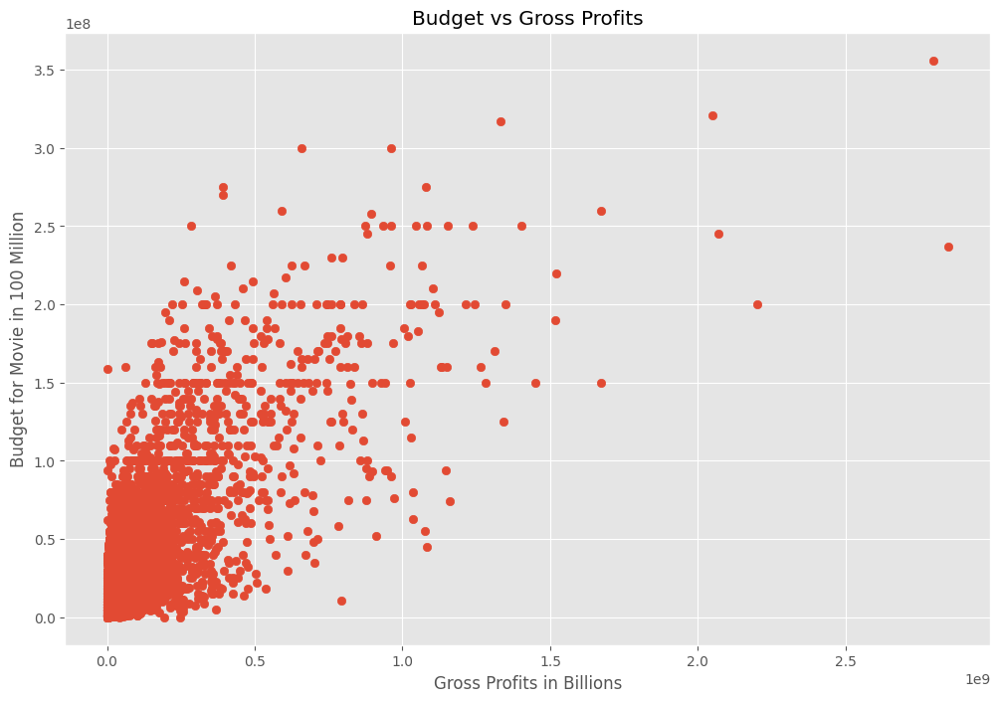

In [81]:
plt.scatter(x = df['gross'], y = df['budget'])
plt.title('Budget vs Gross Profits')
plt.xlabel('Gross Profits in Billions')
plt.ylabel('Budget for Movie in 100 Million')

plt.show()

Text(0, 0.5, 'Budget for Movie in 100 Million')

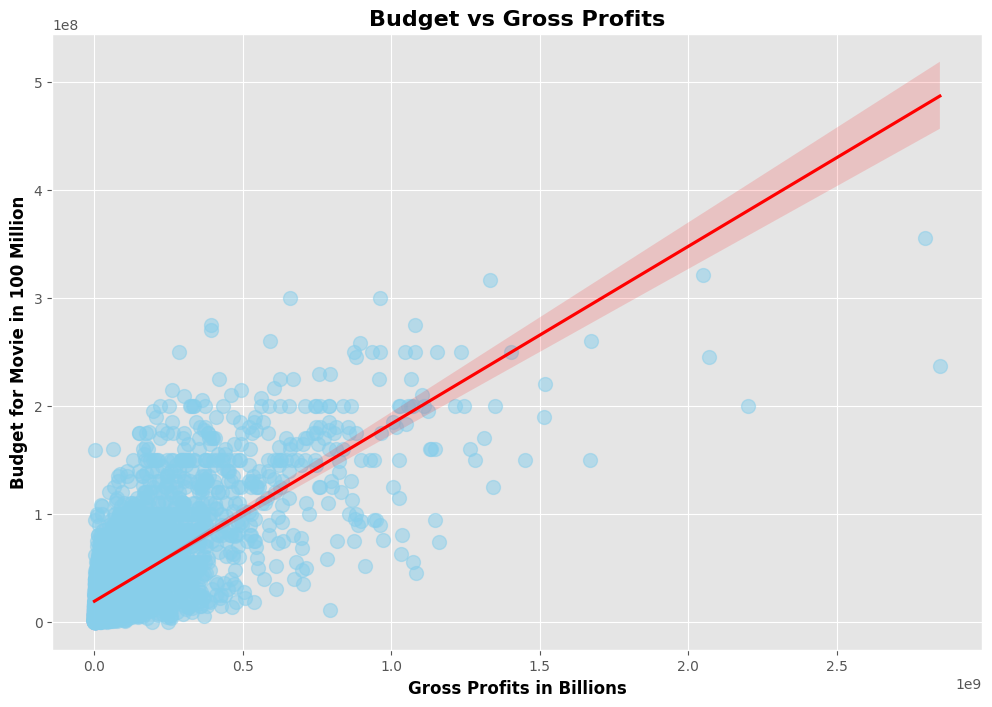

In [82]:
sns.regplot(x="gross", y="budget", data=df, color='skyblue', scatter_kws={'s': 100, 'alpha': 0.5}, line_kws={'color': 'red'})
plt.title('Budget vs Gross Profits', fontsize=16, fontweight='bold', color='Black')
plt.xlabel('Gross Profits in Billions', fontsize=12, fontweight='bold', color='Black')
plt.ylabel('Budget for Movie in 100 Million', fontsize=12, fontweight='bold', color='Black')

In [83]:
# Drop non-numeric columns
numeric_df = df.select_dtypes(include=['float64', 'int64'])

In [84]:
numeric_df.corr(method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.055174,0.205758,0.327781,0.274264,0.074203
score,0.055174,1.000000,0.473809,0.071792,0.222143,0.414580
votes,0.205758,0.473809,1.000000,0.440021,0.614904,0.352437
budget,0.327781,0.071792,0.440021,1.000000,0.740395,0.318595
gross,0.274264,0.222143,0.614904,0.740395,1.000000,0.275596
runtime,0.074203,0.414580,0.352437,0.318595,0.275596,1.000000


In [85]:
numeric_df.corr(method='kendall')

,year,score,votes,budget,gross,runtime
year,1.000000,0.038391,0.295884,0.220991,0.239313,0.064106
score,0.038391,1.000000,0.350111,-0.006518,0.124715,0.292872
votes,0.295884,0.350111,1.000000,0.346228,0.553640,0.205616
budget,0.220991,-0.006518,0.346228,1.000000,0.512637,0.230879
gross,0.239313,0.124715,0.553640,0.512637,1.000000,0.176825
runtime,0.064106,0.292872,0.205616,0.230879,0.176825,1.000000


In [86]:
numeric_df.corr(method='spearman')

,year,score,votes,budget,gross,runtime
year,1.000000,0.056269,0.426571,0.313199,0.350679,0.094396
score,0.056269,1.000000,0.495379,-0.010133,0.182857,0.413040
votes,0.426571,0.495379,1.000000,0.493404,0.745815,0.300959
budget,0.313199,-0.010133,0.493404,1.000000,0.693670,0.330276
gross,0.350679,0.182857,0.745815,0.693670,1.000000,0.257121
runtime,0.094396,0.413040,0.300959,0.330276,0.257121,1.000000


In [87]:
#MAKING GRAPH TO LOOK AT RATING AND GROSS PROFITS

Text(0, 0.5, 'Rating (1-10)')

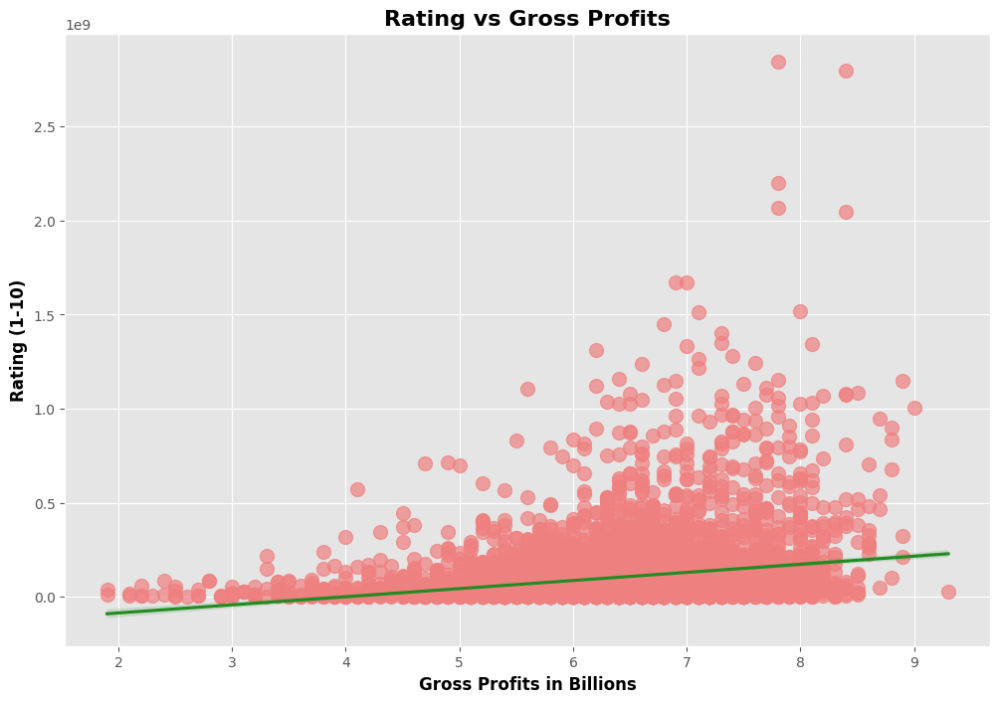

In [88]:
sns.regplot(x="score", y="gross", data=df, scatter_kws={'s': 100, 'alpha': 0.7, 'color': 'lightcoral'}, line_kws={'color': 'forestgreen'})

plt.title('Rating vs Gross Profits', fontsize=16, fontweight='bold', color='Black')
plt.xlabel('Gross Profits in Billions', fontsize=12, fontweight='bold', color='Black')
plt.ylabel('Rating (1-10)', fontsize=12, fontweight='bold', color='Black')

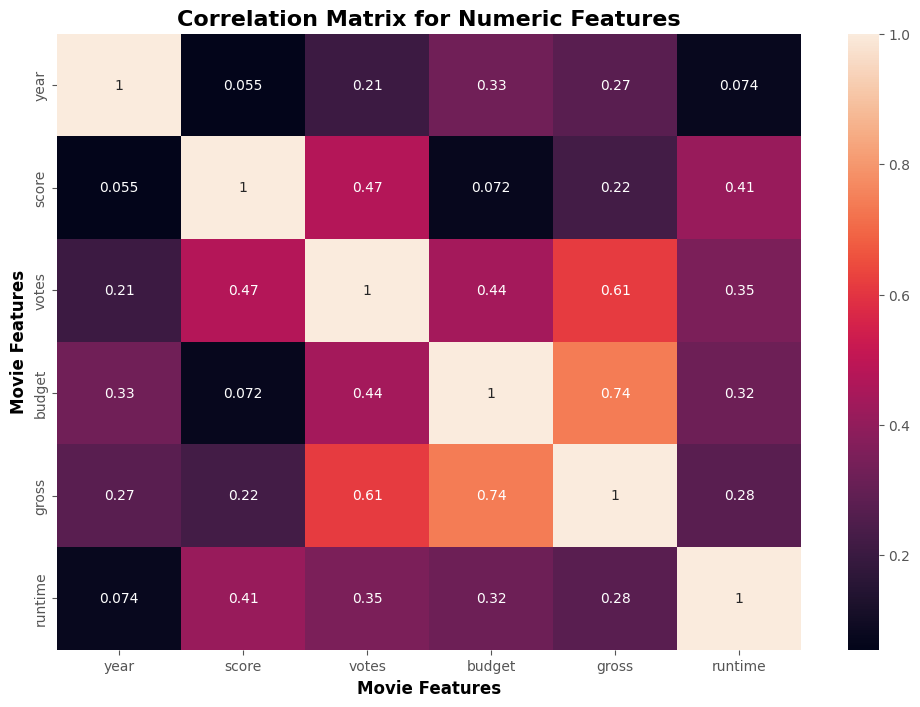

In [97]:
correlation_matrix = numeric_df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation Matrix for Numeric Features", fontsize=16, fontweight='bold', color='Black')

plt.xlabel("Movie Features", fontsize=12, fontweight='bold', color='Black')

plt.ylabel("Movie Features", fontsize=12, fontweight='bold', color='Black')

plt.show()

In [90]:
df_numerized = df.copy()


for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

In [91]:
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,387,5,0,2009,528,7.8,1100000.0,787,1265,1538,47,237000000,2847246203,1388,162.0
7445,389,5,0,2019,138,8.4,903000.0,106,515,1474,47,356000000,2797501328,987,181.0
3045,4923,5,6,1997,535,7.8,1100000.0,787,1265,1076,47,200000000,2201647264,1388,194.0
6663,3656,5,0,2015,530,7.8,876000.0,770,1810,357,47,245000000,2069521700,949,138.0
7244,390,5,0,2018,146,8.4,897000.0,106,515,1474,47,321000000,2048359754,987,149.0
7480,4402,4,2,2019,1130,6.9,222000.0,1014,1364,458,47,260000000,1670727580,1429,118.0
6653,2125,5,0,2015,1307,7.0,593000.0,337,2530,294,47,150000000,1670516444,1403,124.0
6043,3891,5,0,2012,1905,8.0,1300000.0,1062,1650,1474,47,220000000,1518815515,987,143.0
6646,1545,5,0,2015,166,7.1,370000.0,811,483,1792,47,190000000,1515341399,1403,137.0
7494,1534,4,2,2019,2059,6.8,148000.0,279,1386,1039,47,150000000,1450026933,1428,103.0


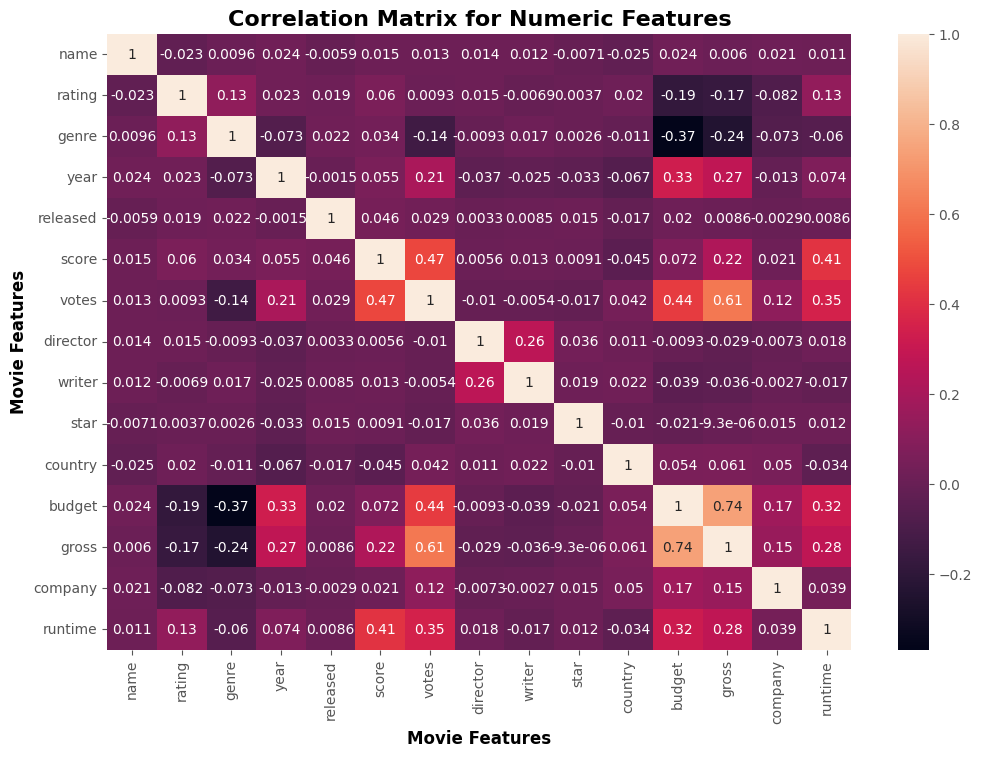

In [96]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation Matrix for Numeric Features", fontsize=16, fontweight='bold', color='Black')

plt.xlabel("Movie Features", fontsize=12, fontweight='bold', color='Black')

plt.ylabel("Movie Features", fontsize=12, fontweight='bold', color='Black')

plt.show()

In [105]:
#We will not look at more correlations

In [99]:
correlation_matrix = df_numerized.corr()

corr_pairs = correlation_matrix.unstack()
corr_pairs

name      name        1.000000
          rating     -0.023013
          genre       0.009617
          year        0.024435
          released   -0.005896
          score       0.014955
          votes       0.012915
          director    0.013699
          writer      0.011602
          star       -0.007109
          country    -0.024555
          budget      0.023698
          gross       0.005966
          company     0.021209
          runtime     0.010800
rating    name       -0.023013
          rating      1.000000
          genre       0.128102
          year        0.022668
          released    0.018836
          score       0.059550
          votes       0.009255
          director    0.014847
          writer     -0.006923
          star        0.003737
          country     0.020148
          budget     -0.186892
          gross      -0.168814
          company    -0.082189
          runtime     0.133239
genre     name        0.009617
          rating      0.128102
        

In [101]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre     budget     -0.368900
budget    genre      -0.368900
genre     gross      -0.244380
gross     genre      -0.244380
rating    budget     -0.186892
budget    rating     -0.186892
rating    gross      -0.168814
gross     rating     -0.168814
votes     genre      -0.136457
genre     votes      -0.136457
rating    company    -0.082189
company   rating     -0.082189
genre     company    -0.073293
company   genre      -0.073293
genre     year       -0.073026
year      genre      -0.073026
country   year       -0.066662
year      country    -0.066662
genre     runtime    -0.060186
runtime   genre      -0.060186
country   score      -0.044690
score     country    -0.044690
writer    budget     -0.039420
budget    writer     -0.039420
year      director   -0.036936
director  year       -0.036936
writer    gross      -0.035999
gross     writer     -0.035999
runtime   country    -0.033554
country   runtime    -0.033554
year      star       -0.032770
star      year       -0.032770
gross   

In [103]:
high_corr = sorted_pairs[(sorted_pairs)>.5]
high_corr

gross     votes       0.614904
votes     gross       0.614904
budget    gross       0.740395
gross     budget      0.740395
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [113]:
#We can see that votes has a pretty high correlation with the gross profits, interesting.
#I usually think that the highest grossing films do not get many votes as awards usually go to less 'big box office' movies.
#Learned something new.

Text(0, 0.5, 'Votes in Millions')

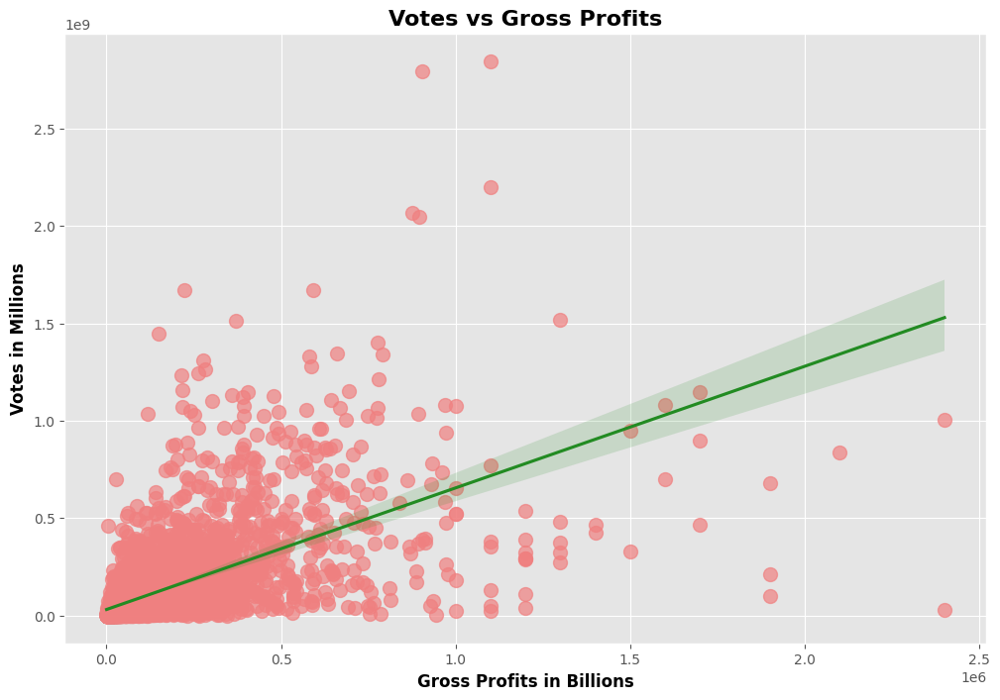

In [109]:
sns.regplot(x="votes", y="gross", data=df, scatter_kws={'s': 100, 'alpha': 0.7, 'color': 'lightcoral'}, line_kws={'color': 'forestgreen'})

plt.title('Votes vs Gross Profits', fontsize=16, fontweight='bold', color='Black')
plt.xlabel('Gross Profits in Billions', fontsize=12, fontweight='bold', color='Black')
plt.ylabel('Votes in Millions', fontsize=12, fontweight='bold', color='Black')